In [1]:
import xarray as xr  
import matplotlib.pyplot as py
import keras
import numpy as np
from keras.layers import Conv2D, Conv2DTranspose, Input, Flatten, Dense, Lambda, Reshape, Dropout
from keras.layers import BatchNormalization
from keras.models import Model
from keras.datasets import mnist
from keras.losses import binary_crossentropy
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import keras.backend as K


In [ ]:
rainfall = xr.open_dataset(r"C:\Users\rampaln\OneDrive - NIWA\Python Tools\VCSN\gridded_vcsn_Rain_1973-1-1_2020-07-17.nc")

# Autoencoding the Rainfall VCSN Dataset
1. First we commpute the anomalies, relatively to the daily mean of rainfall (a monthly time scale is probably better for this analysis)
2. Because there is some degree of predictability in the seasonal cycle, it makes more sense to test this out on the anomalies of rainfall. 

In [453]:
def demean(x): 
    return x - x.sel(time=slice('1981','2010')).mean('time')
rains = rainfall['Rain'].groupby(rainfall.time.dt.dayofyear).apply(demean)

	

### Loading the Datasets into memory

In [862]:
rainfall.load()
rains.load()

## Masking the dataset, to extract only valid rainfall values
1. The Figure below shows an example anomally pattern

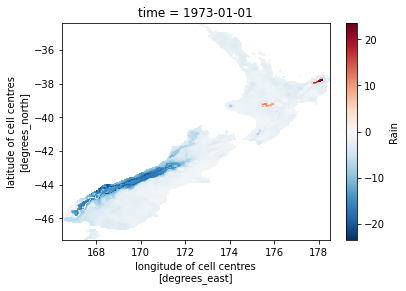

In [456]:
fig,ax = py.subplots()
rains.isel(time =0).plot(ax = ax)
fig.show()

In [460]:
mask = rainfall['Rain'].mean(["time"])

## Creating a training dataset
1. Reshaping the data (removing the latitude and longitude dimensions)
2. Removing all the nan values (only where the mask is valid)

In [457]:
data = rains.values

In [458]:

reshape_precipitation = data.reshape(data.shape[0], np.prod(data.shape[1:]))

In [461]:
mask = mask.values.reshape(np.prod(mask.shape))

In [462]:
precipitation = reshape_precipitation.T[mask>0.0]

In [463]:
data = precipitation.T

# Creating an Autoencoder model

1. Relatively basic model, but with lots of weights.
2. Batch normalisation has greatly improved the training and validation accuracy
3. Relu activation is not used in the last layer (as we need to predict anomalies which are positive)

In [814]:
input_img = Input(shape=(data.shape[-1],))
encoded = Dropout(0.01)(input_img)
# Dropout layer isn't really needed but I've left it here just incase
encoded = BatchNormalization()(encoded)
encoded = Dense(1024, activation='relu')(encoded)
encoded = BatchNormalization()(encoded)
encoded = Dense(64, activation='relu')(encoded)
encoded = BatchNormalization()(encoded)
encoded = Dense(16, activation='relu')(encoded)
encoded = BatchNormalization()(encoded)
decoded = Dense(64, activation='relu')(encoded)
decoded = BatchNormalization()(decoded)
decoded = Dense(1024, activation='relu')(decoded)
decoded = BatchNormalization()(decoded)
decoded = Dense(data.shape[-1], activation='linear')(decoded)

# Initialising the model
autoencoder = Model(input_img, decoded)
autoencoder.compile(optimizer='Adam', loss='mse')

## Creating a training and testing dataset for the Encoder

In [468]:
# training set
training_data = data
x_train,x_test, y_train,y_test = train_test_split(training_data, np.arange(training_data.shape[0]))

## Custom Loss functions
1. These have been proven to be less effective than the standard mse.
2. More complex loss functions will be developed in the future.

In [278]:
import keras.backend as K

def customLoss(yTrue,yPred):
    subset_1 = yTrue[yTrue > 5]
    subset_2 = yPred[yTrue > 5]
    difference = abs(subset_1 - subset_2)**2
    subset_3 = yTrue[yTrue < 5]
    subset_4 = yPred[yTrue < 5]
    difference2 = abs(subset_1 - subset_2)**2
    return 1/7.0*K.mean(difference) + 6/7.0 * K.mean(difference2)

## Fitting the Autoencoder

In [815]:
autoencoder.summary()


Model: "model_63"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_53 (InputLayer)        (None, 11491)             0         
_________________________________________________________________
dropout_35 (Dropout)         (None, 11491)             0         
_________________________________________________________________
batch_normalization_73 (Batc (None, 11491)             45964     
_________________________________________________________________
dense_223 (Dense)            (None, 1024)              11767808  
_________________________________________________________________
batch_normalization_74 (Batc (None, 1024)              4096      
_________________________________________________________________
dense_224 (Dense)            (None, 64)                65600     
_________________________________________________________________
batch_normalization_75 (Batc (None, 64)                256

In [844]:
autoencoder.fit(x_train, x_train,
                epochs=50,
                batch_size=1024,
                shuffle=True,
                validation_data=(x_test, x_test))
# Note there has been training prior to these results shown below

Train on 13023 samples, validate on 4342 samples
Epoch 1/5
13023/13023 [==============================] - 32s 2ms/step - loss: 13.7282 - val_loss: 17.8604
Epoch 2/5
13023/13023 [==============================] - 26s 2ms/step - loss: 14.0023 - val_loss: 15.4211
Epoch 3/5
13023/13023 [==============================] - 27s 2ms/step - loss: 13.8675 - val_loss: 16.9125
Epoch 4/5
13023/13023 [==============================] - 26s 2ms/step - loss: 13.7675 - val_loss: 17.3045
Epoch 5/5
13023/13023 [==============================] - 28s 2ms/step - loss: 13.7261 - val_loss: 15.4450


## Model Predictions
1. For this example we have predicted both the training and testing data combined to plot the time series to understand each of the components
2. We defined a autoencoder, as well as an encoder so that we can visualise the latent space that the model learns.
3. Understanding the latent space may improve the predictability or help the understanding of rainfall distributions in New Zealand
4. Pannel on the Left are the autoencoded predictions

In [818]:
testing = autoencoder.predict(training_data)
encoder = Model(input_img, encoded)
encoded_img = encoder.predict(training_data)

In [819]:
def model_output_to_map(autoencoded_prediction):
    x = np.zeros([autoencoded_prediction.shape[0],reshape_precipitation.shape[1]])*np.nan
    

    x.T[mask >0.0] = autoencoded_prediction.T#norm.inverse_transform(testing).T
    x1 = x.reshape(x.shape[0],257, 241)
    return x1

In [865]:
x_out = model_output_to_map(testing)
x_true = model_output_to_map(training_data)

In [869]:
print(f"The mean squared error for Encoder is {np.nanmean(abs(x_out - x_true)**2)}")

The mean squared error for the Encoder is 15.511116


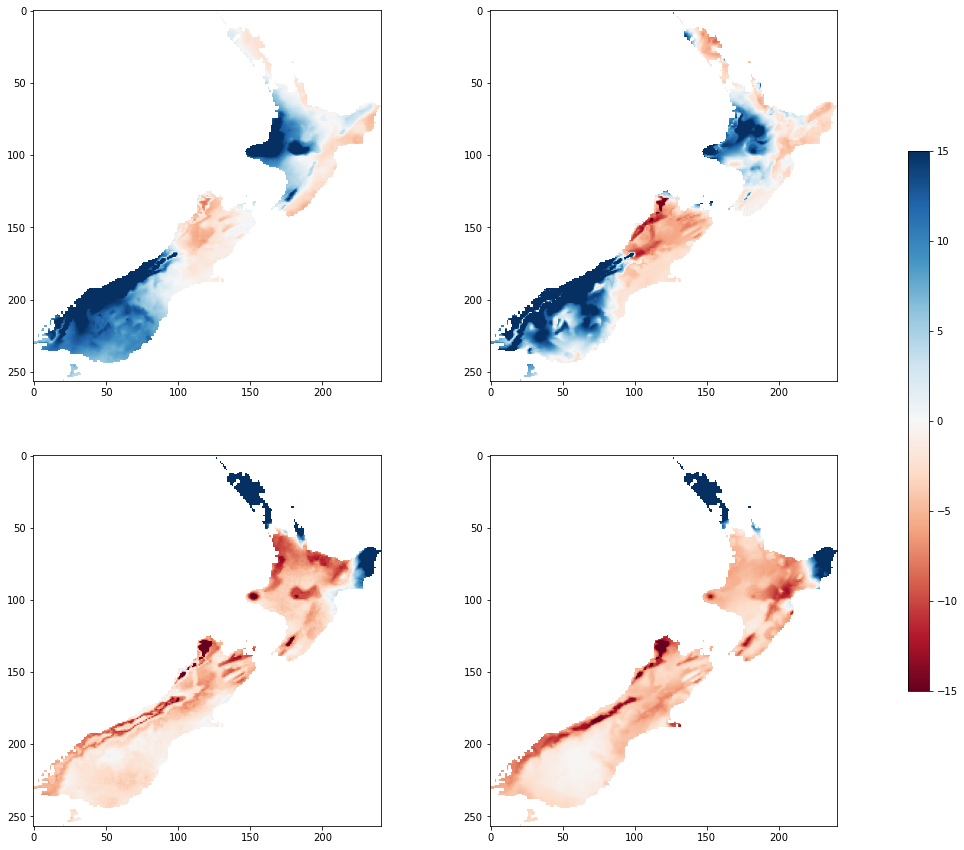

In [843]:
idx = 9
fig, ax = py.subplots(2,2, figsize =(15,15))
ax[0,0].imshow(x_out[idx][::-1],vmin =-15,vmax =15, cmap ='RdBu')
cs = ax[0,1].imshow(x_true[idx][::-1],vmin =-15,vmax =15, cmap ='RdBu')

# Extreme rainfall that occured in Northland
idx = -1
ax[1,0].imshow(x_out[idx][::-1],vmin =-15,vmax =15, cmap ='RdBu')
cs = ax[1,1].imshow(x_true[idx][::-1],vmin =-15,vmax =15, cmap ='RdBu')
ax4 = fig.add_axes([0.95,0.25,0.02,0.5])
fig.colorbar(cs, cax =ax4)

## Alternative Methods to the Analysis (PCA)

In [849]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 16, whiten = True)
output = pca.fit_transform(training_data)
x_out = model_output_to_map(pca.inverse_transform(output))

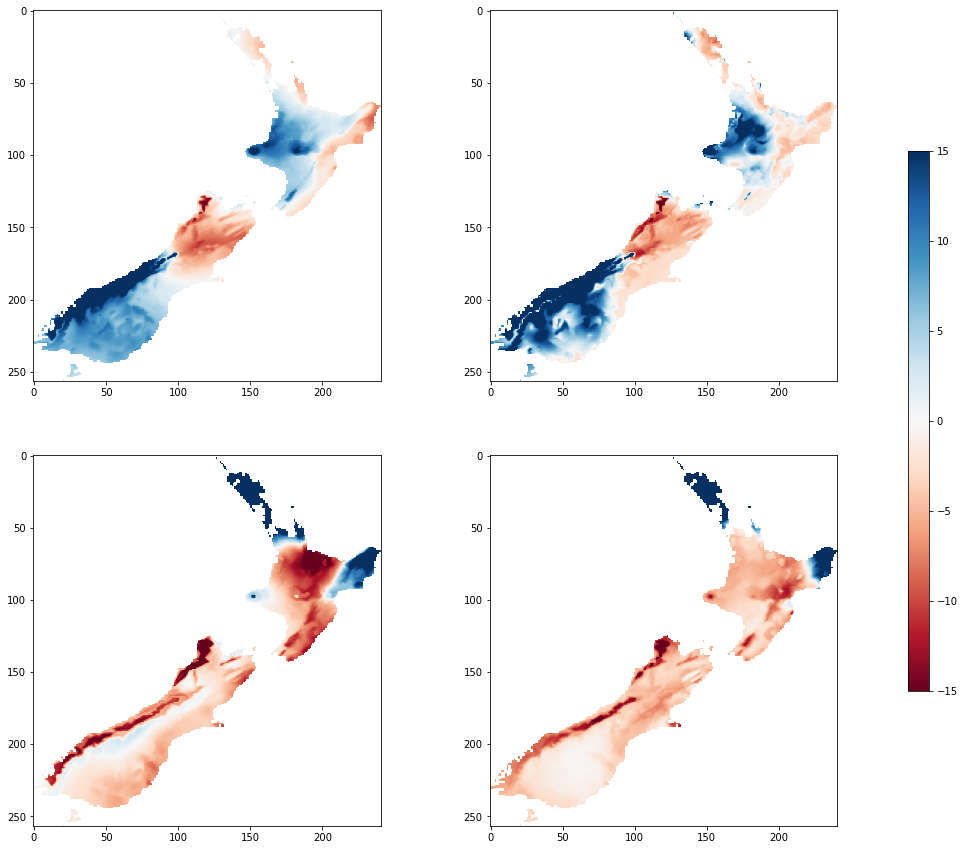

In [850]:
idx = 9
fig, ax = py.subplots(2,2, figsize =(15,15))
ax[0,0].imshow(x_out[idx][::-1],vmin =-15,vmax =15, cmap ='RdBu')
cs = ax[0,1].imshow(x_true[idx][::-1],vmin =-15,vmax =15, cmap ='RdBu')

# Extreme rainfall that occured in Northland
idx = -1
ax[1,0].imshow(x_out[idx][::-1],vmin =-15,vmax =15, cmap ='RdBu')
cs = ax[1,1].imshow(x_true[idx][::-1],vmin =-15,vmax =15, cmap ='RdBu')
ax4 = fig.add_axes([0.95,0.25,0.02,0.5])
fig.colorbar(cs, cax =ax4)

In [852]:
print(f"The mean squared error for PCA is {np.nanmean(abs(x_out - x_true)**2)}")

The mean squared error for PCA is 16.778671164138174


## Understanding the distribution of parameters in the latent space
1. Outputs are normalised after the 8 Dense layer.
2. Outputs have a mean that is near zero and a variance that us 1. However, both the distributions of precipitation and the encoded latent space do not have characteristics of normal distributions. 

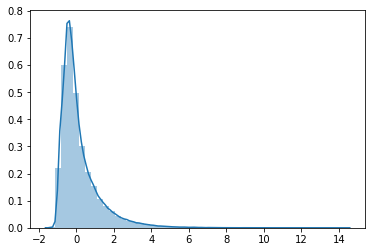

In [751]:
import seaborn as sns
sns.distplot(encoded_img[:,0])

In [ ]:
## Visualising the Latent Space

In [699]:
encoding_dim = (16,)
encoded_input = Input(shape=encoding_dim)
x = encoded_input
for layer in autoencoder.layers[-5:]:
    x = layer(x)
Models = Model(encoded_input, x)

In [700]:
Models.input_shape

(None, 8)

In [669]:
def model_output_to_map(prediction):
    x = np.zeros([prediction.shape[0],reshape_precipitation.shape[1]])*np.nan
    

    x.T[mask >0.0] = Models.predict(prediction).T#norm.inverse_transform(testing).T
    x1 = x.reshape(x.shape[0],257, 241)
    return x1


In [712]:
encoded_img[-1]

array([ 0.80402833,  4.3314857 , -1.4344512 , -0.18243128, -0.79287696,
        0.41629457,  0.9214298 , -0.8440378 ], dtype=float32)

## Exploring the Latent Space by Perturbing the parameters
1. We perturb the parameters to examine how these effect regional rainfall.

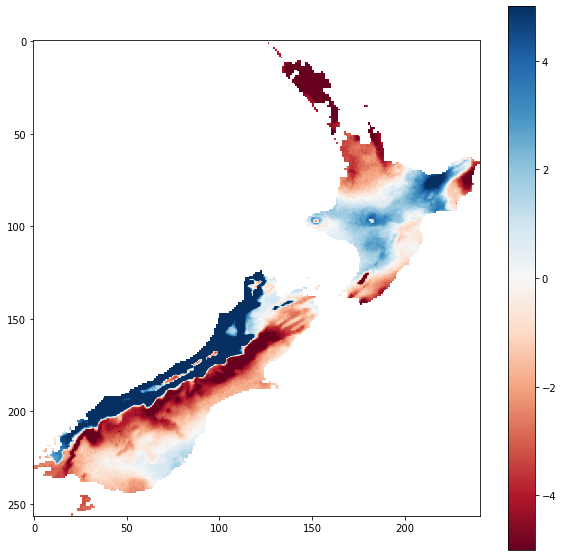

In [748]:
x2= np.ones(16)*0.0
x2[0] =0
x2[1] =0.0
x2[2] =0
x2[3]=0.0
x2[4] = 0.0
x2[-1] =2
x2 =x2# encoded_img[-1]
z=model_output_to_map(x2[np.newaxis,:])#x2[np.newaxis,:])

py.figure(figsize = (10,10))
py.imshow(z[0][::-1],vmin =-5, vmax =5, cmap ='RdBu')
py.colorbar()

In [717]:
times = rainfall.time.to_index()
import pandas as pd
df = pd.DataFrame(data = encoded_img, index = times, columns = np.arange(16))

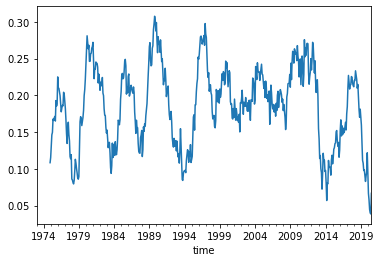

In [861]:
df[1].resample('1MS').mean().rolling(window = 24).mean().plot()
#  This index has the lowest value for the most recent drought (averaged over 2 years)